## **Bike_Sharing_Rental**

### Problem Statement
The business problem is to ensure a stable supply of rental bikes in urban cities by predicting the demand for bikes. By providing a stable supply of rental bikes, the system can enhance mobility comfort for the public and reduce waiting time, leading to greater customer satisfaction and accurately predicting bike demand can help bike sharing companies optimize operations including bike availability, pricing, strategies, and marketing efforts by considering demand Based on various external factors such as weather, season, holiday etc..,

### Project Objective
The goal of this project is to examine historical bike rental data and determine the primary factors that affect rental demand. By identifying trends and building predictive models, the project aims to contribute to better resource allocation, demand predictions, and overall operational planning for bike-sharing schemes.

### **1. Exploaratory Data Analysis**

 #### A. Import Necessary Libraries

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize']=(10, 10)
plt.rcParams['figure.dpi']=500

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

####  B. Load the Dataset


In [8]:
df=pd.read_csv('Dataset.csv', index_col=0)
df.head()

,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
instant,,,,,,,,,,,,,,,,
1,01-01-2011,springer,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.81,0,3,13,16
2,01-01-2011,springer,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.8,0,8,32,40
3,01-01-2011,springer,2011,1,2,No,6,No work,Clear,0.22,0.2727,?,0,5,27,32
4,01-01-2011,springer,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.75,0,3,10,13
5,01-01-2011,springer,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.75,0,0,1,1


In [9]:
# Check necessary information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17379 entries, 1 to 17379
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   dteday      17379 non-null  object
 1   season      17379 non-null  object
 2   yr          17379 non-null  object
 3   mnth        17379 non-null  object
 4   hr          17379 non-null  int64 
 5   holiday     17379 non-null  object
 6   weekday     17379 non-null  int64 
 7   workingday  17379 non-null  object
 8   weathersit  17379 non-null  object
 9   temp        17379 non-null  object
 10  atemp       17379 non-null  object
 11  hum         17379 non-null  object
 12  windspeed   17379 non-null  object
 13  casual      17379 non-null  object
 14  registered  17379 non-null  object
 15  cnt         17379 non-null  int64 
dtypes: int64(3), object(13)
memory usage: 2.3+ MB


**Observations:**
- Dataset contains 17,379 records and 16 columns.
- Dataset does not contain any missing values.
- Most of the columns appear numerical or time based are stored as object type columns and would require to conversion for numerical analysis or times series operations.

In [11]:
# Display the count of unique values for each column
print('Unique values per column:')
df.nunique()

Unique values per column:


dteday        731
season          5
yr              3
mnth           13
hr             24
holiday         3
weekday         7
workingday      3
weathersit      5
temp           51
atemp          66
hum            90
windspeed      31
casual        323
registered    777
cnt           869
dtype: int64

In [12]:
#Cheking for null values
df.isnull().sum()

dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [13]:
#Replacing Misleading Values with Nan
df.replace(r'^\s*(\?|NA|N/A|null|None)\s*$',np.nan,regex=True,inplace=True)

In [14]:
#Checking For duplicate values
df.duplicated().sum()

0

In [15]:
#Statistical Values
df.describe()

,hr,weekday,cnt
count,17379.000000,17379.000000,17379.000000
mean,11.546752,3.003683,189.463088
std,6.914405,2.005771,181.387599
min,0.000000,0.000000,1.000000
25%,6.000000,1.000000,40.000000
50%,12.000000,3.000000,142.000000
75%,18.000000,5.000000,281.000000
max,23.000000,6.000000,977.000000


In [16]:
df.describe(include='object')

,dteday,season,yr,mnth,holiday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered
count,17379,17373,17378,17378,17378,17374,17375,17368,17373,17373,17374,17378,17378
unique,731,4,2,12,2,2,4,50,65,89,30,322,776
top,01-01-2011,fall,2012,5,No,Working Day,Clear,0.62,0.6212,0.88,0,0,4
freq,24,4496,8734,1488,16878,11862,11412,726,988,657,2180,1581,307


**Observations:**
- There are no null values and Duplicate values present in the Dataset.
- There some ? values present in replace them with  Nan values.
- The summary statistics highlight the spread and scale of numerical features in dataset. Variables like temperature, humidity, and windspeed are already normalized, making them suitable for modeling. This analysis helps identify data patterns and potential outliers before further processing.


#### C. Data Preprocessing

In [19]:
#Numerical Columns
cols=['yr', 'mnth','casual', 'registered']
df[cols]=(df[cols].apply(pd.to_numeric, errors='coerce').round(0).astype('Int64'))
df[['temp','atemp', 'windspeed', 'hum']]=df[['temp','atemp','windspeed', 'hum']].astype('float64')

#Date Time Columns
df['dteday']=pd.to_datetime(df['dteday'], errors='coerce', format='%d-%m-%Y')

#create a datetime column for work on date-hr basis analysis
df['datetime']=df['dteday']+pd.to_timedelta(df['hr'].astype(int), unit='h')


In [20]:
df.rename(columns={'dteday':'date','yr':'year', 'hum':'humidity', 'cnt':'count', 'mnth': 'month', }, inplace=True)
df.columns

Index(['date', 'season', 'year', 'month', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'humidity', 'windspeed',
       'casual', 'registered', 'count', 'datetime'],
      dtype='object')

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17379 entries, 1 to 17379
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        17379 non-null  datetime64[ns]
 1   season      17373 non-null  object        
 2   year        17378 non-null  Int64         
 3   month       17378 non-null  Int64         
 4   hr          17379 non-null  int64         
 5   holiday     17378 non-null  object        
 6   weekday     17379 non-null  int64         
 7   workingday  17374 non-null  object        
 8   weathersit  17375 non-null  object        
 9   temp        17368 non-null  float64       
 10  atemp       17373 non-null  float64       
 11  humidity    17373 non-null  float64       
 12  windspeed   17374 non-null  float64       
 13  casual      17378 non-null  Int64         
 14  registered  17378 non-null  Int64         
 15  count       17379 non-null  int64         
 16  datetime    17379 non-null 

In [22]:
print('Null values present in datast:')
df.isnull().sum()

Null values present in datast:


date           0
season         6
year           1
month          1
hr             0
holiday        1
weekday        0
workingday     5
weathersit     4
temp          11
atemp          6
humidity       6
windspeed      5
casual         1
registered     1
count          0
datetime       0
dtype: int64

- After conversion of datatypes there some null values are captured in dataset.
- So replace them with mean or mode values.

In [24]:
# Remove null values of Categorical Columns
cat_cols=df.select_dtypes(include='object').columns
for col in cat_cols:
    df[col].fillna(df[col].mode().iloc[0], inplace=True)

#Remove null values of numerical Columns
num_cols=df.select_dtypes(include='number').columns
for col in num_cols:
    df[col].fillna(df[col].mean().round(0), inplace=True)


In [25]:
df.head()


,date,season,year,month,hr,holiday,weekday,workingday,weathersit,temp,atemp,humidity,windspeed,casual,registered,count,datetime
instant,,,,,,,,,,,,,,,,,
1,2011-01-01,springer,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.81,0.0,3,13,16,2011-01-01 00:00:00
2,2011-01-01,springer,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.80,0.0,8,32,40,2011-01-01 01:00:00
3,2011-01-01,springer,2011,1,2,No,6,No work,Clear,0.22,0.2727,1.00,0.0,5,27,32,2011-01-01 02:00:00
4,2011-01-01,springer,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.75,0.0,3,10,13,2011-01-01 03:00:00
5,2011-01-01,springer,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.75,0.0,0,1,1,2011-01-01 04:00:00


### **2. Data Visualization**

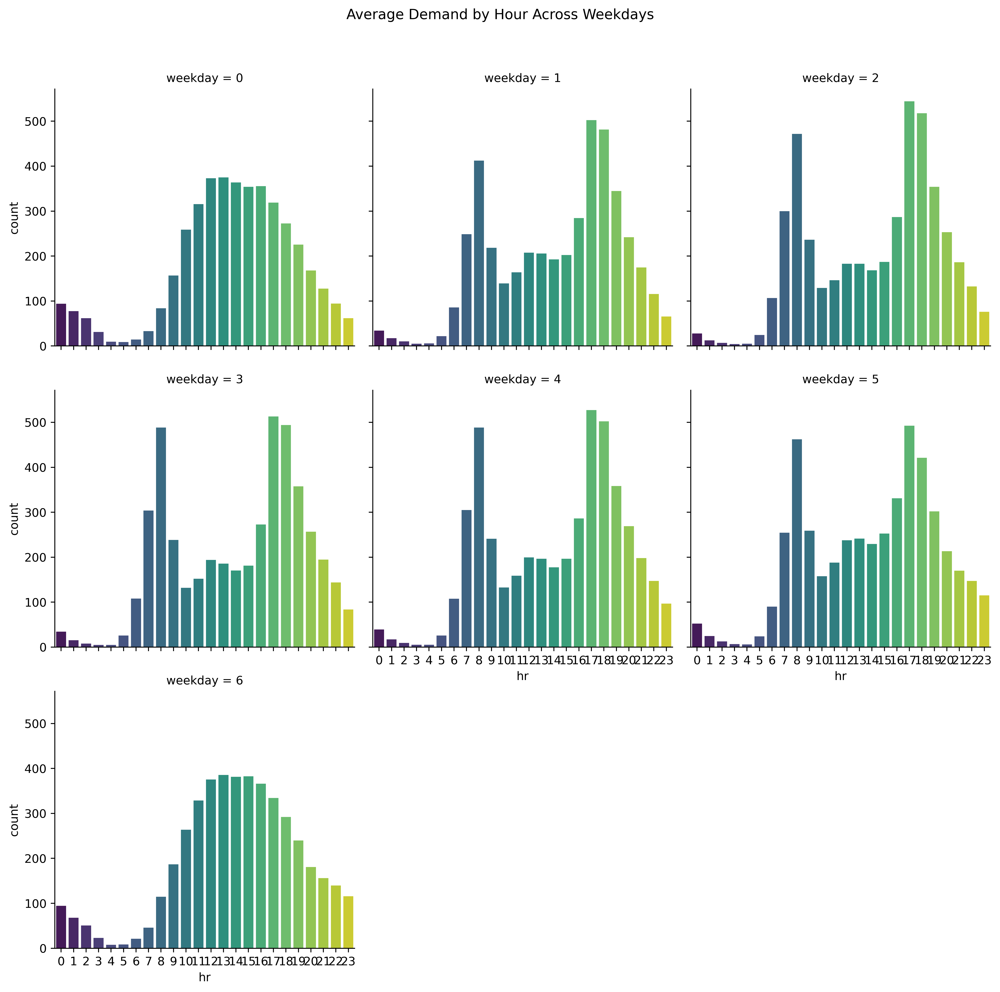

In [27]:
# Average Demand by Hour Across Weekdays
weekday_hour_demand = df.groupby(['weekday','hr'])['count'].mean().reset_index()

# Facet bar plot
sns.catplot(x='hr', y='count', col='weekday', data=weekday_hour_demand,
            kind='bar', col_wrap=3, palette='viridis', height=4)

plt.subplots_adjust(top=0.9)
plt.suptitle('Average Demand by Hour Across Weekdays')
plt.show()

The plot reveals distinct hourly rental patterns across weekdays, with commute-time peaks on weekdays and afternoon peaks on weekends.<br>
##### Weekdays (Mon–Fri):
Bike rentals show two clear peaks. One around 8 AM, matching the morning commute, and another between 5–6 PM, linked to the evening return. This pattern stays almost the same on all weekdays, showing that many users depend on bikes for regular work or school travel.

##### Weekends (Sat–Sun):
Rentals rise gradually and stay high from 11 AM to 4 PM. This wideer peak on weekends suggests that people mostly use bikes for fun and relaxation, not for going to work or school/colleges.

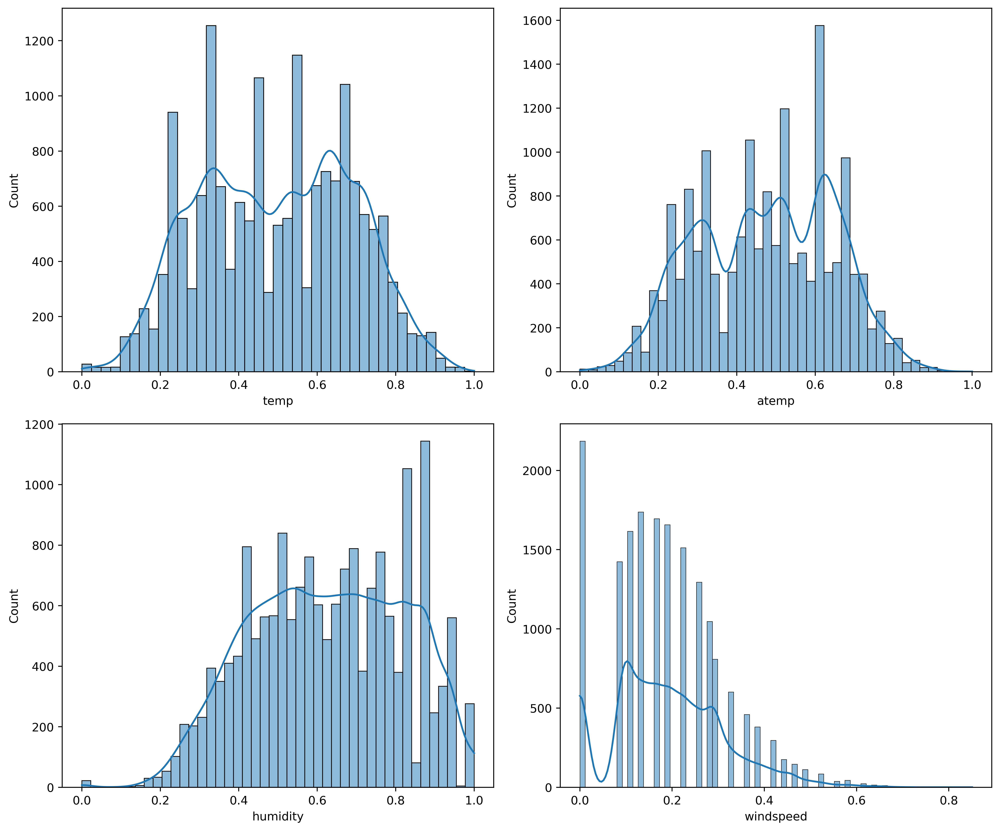

In [29]:
# Distribution of Temperature, Feeling Temperature, Humidity, Windspeed
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.histplot(df['temp'], ax=axes[0, 0], kde=True)
sns.histplot(df['atemp'], ax=axes[0,1], kde=True)
sns.histplot(df['humidity'], ax=axes[1, 0], kde=True)
sns.histplot(df['windspeed'], ax=axes[1, 1], kde=True)

plt.tight_layout()
plt.show()

**Observations:**
- Temperature  and feeling temperature follow near-normal patterns, showing most rentals happen in mild to warm conditions.
- Humidity is slightly right-skewed, with most values in the mid to high range; very dry conditions are rare.
- Windspeed is strongly right-skewed, meaning rentals mostly occur when winds are light.
- Extreme weather conditions have fewer observations and lower usage.

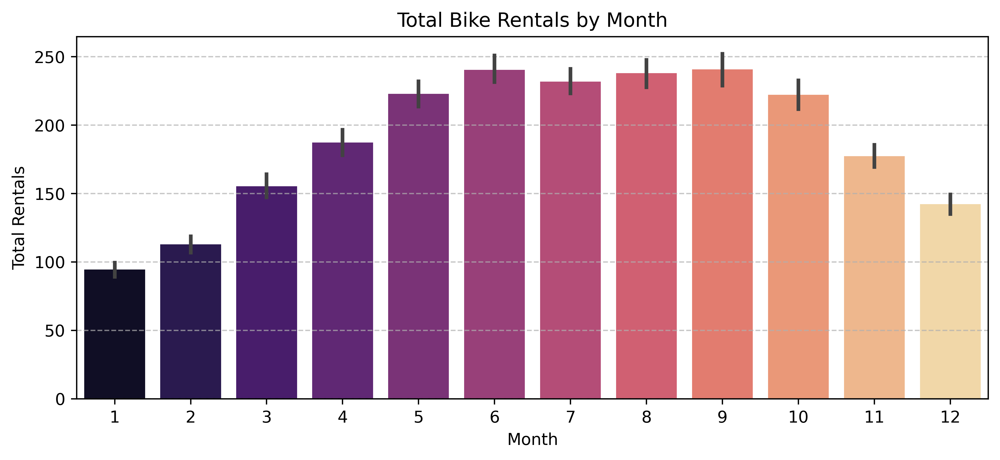

In [31]:
plt.figure(figsize=(10, 4))
sns.barplot(data=df, x='month', y='count', palette='magma')
plt.title('Total Bike Rentals by Month')
plt.xlabel('Month')
plt.ylabel('Total Rentals')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

**Observations**
- Bike rentals are lowest in winter months, starting low in January.
- Rentals steadily increase from spring and peak during summer (June–September).
- Demand remains high and stable during warmer months.
- Rentals decline gradually from October to December due to colder weather.
- This seasonal trend shows that month or season is an important feature for prediction and planning.

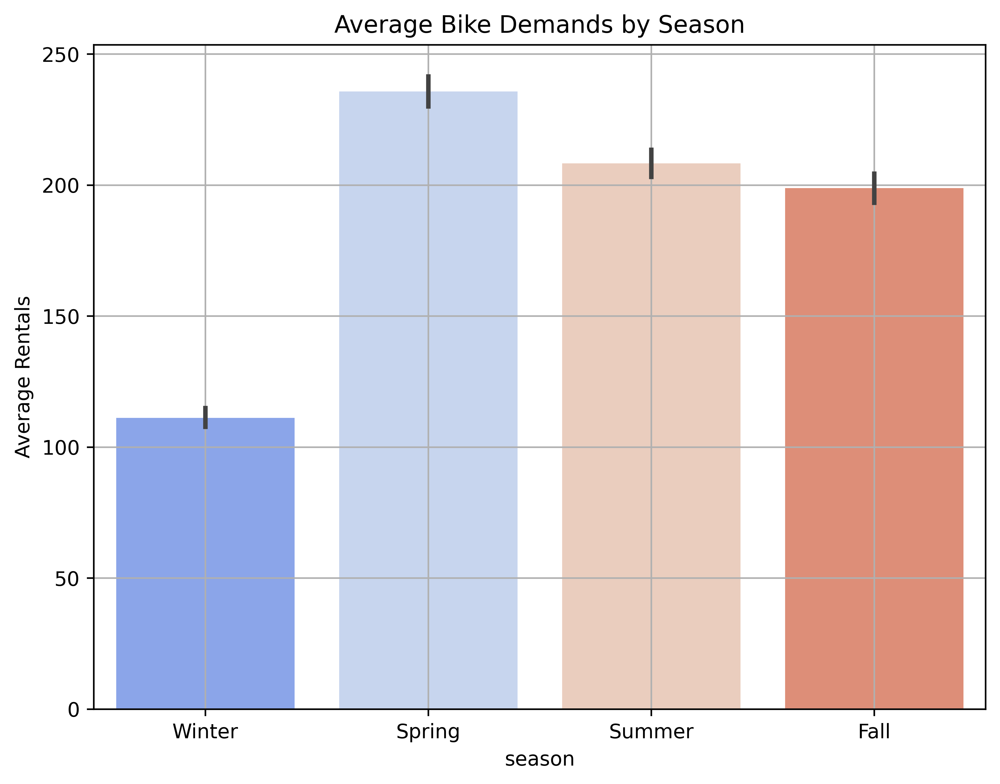

In [33]:
# Compare rentals across seasons

plt.figure(figsize=(8, 6))
sns.barplot(x='season', y='count', data=df, estimator=np.mean, palette='coolwarm')
plt.title('Average Bike Demands by Season')
plt.xticks(ticks=[0,1,2,3], labels=['Winter', 'Spring', 'Summer', 'Fall'])
plt.ylabel('Average Rentals')
plt.grid(True)
plt.show()

**Observations**
- Bike rentals are lowest in winter due to cold weather and shorter daylight hours.
- Rentals increase in spring as weather conditions improve.
- Summer has the highest rentals, driven by warm and dry conditions.
- Fall shows a slight decline but demand remains relatively strong.
- Seasonal patterns clearly affect usage, making season an important feature for forecasting and planning.

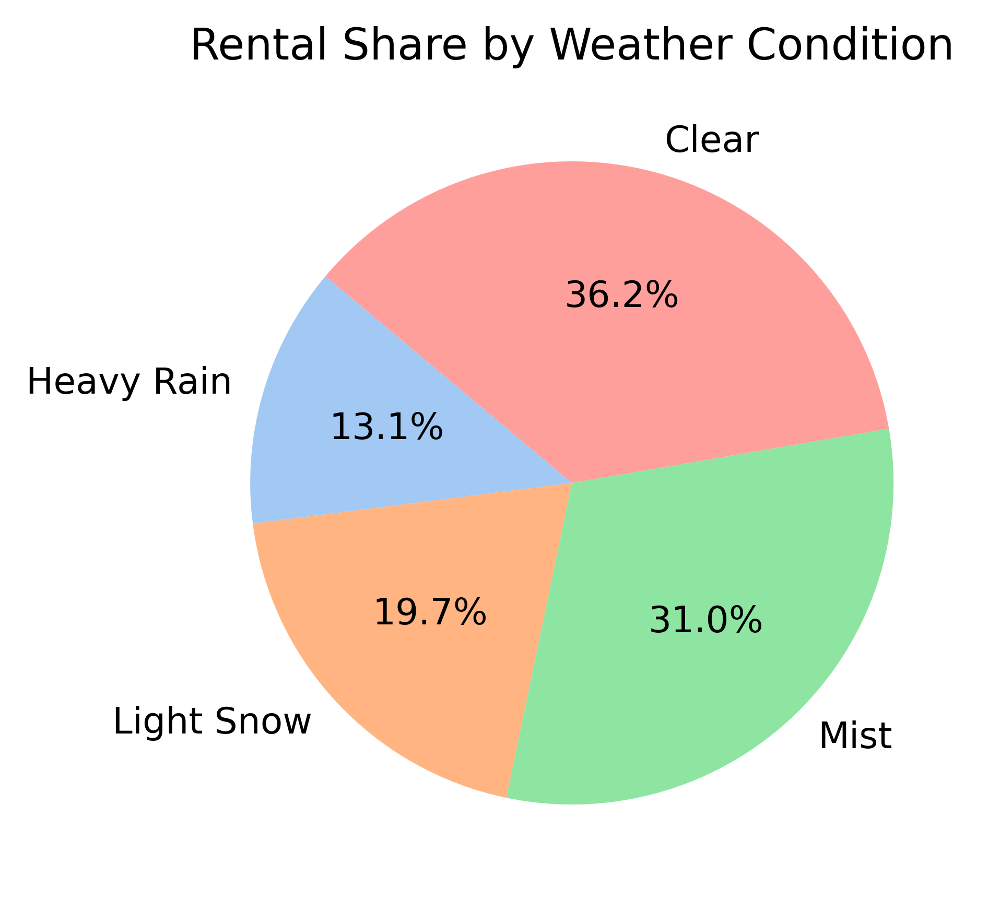

In [35]:
#Weather condition with lowest average rentals
weather_low = (df.groupby('weathersit')['count'].mean().reset_index().sort_values('count', ascending=True))
weather_low
plt.figure(figsize=(6,4))
plt.pie(weather_low['count'], labels=weather_low['weathersit'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.title('Rental Share by Weather Condition')
plt.show()

**Observations**
- Clear weather has the highest rentals (~36%), showing strong preference for good conditions.
- Mist still supports high usage (~31%), with limited impact on demand.
- Light snow lowers rentals (~20%) as conditions become less comfortable.
- Heavy rain shows the lowest demand (~13%), strongly discouraging riders.
- Overall: worse weather leads to fewer bike rentals.

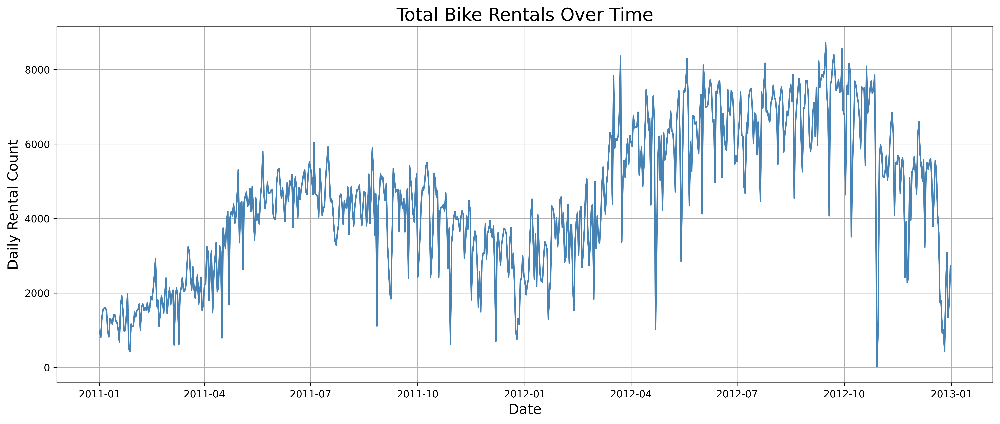

In [37]:
#Resample to daily total rentals
daily_df=df.resample('D', on='datetime')['count'].sum().reset_index()

#plot the resampled daily trend
plt.figure(figsize=(14, 6))
sns.lineplot(data=daily_df, x='datetime', y='count', color='steelblue')
plt.title('Total Bike Rentals Over Time', fontsize=18)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Daily Rental Count', fontsize=14 )
plt.grid(True)
plt.tight_layout()
plt.show()

**Observations**
- Daily bike rentals show a clear upward trend from 2011 to 2012.
- Strong seasonality is visible, with higher rentals in summer and lower in winter.
- A sharp drop around January 2012 likely reflects extreme weather or a holiday period.
- Overall rental levels are higher and more stable in 2012 compared to 2011.

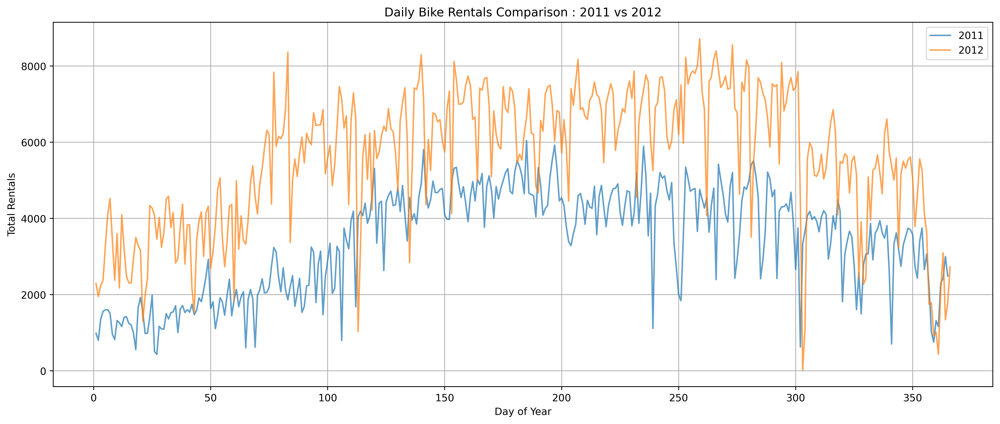

In [39]:
#Extract year and day of year
#df['year']=df['datetime'].dt.year
df['dayofyear']=df['datetime'].dt.dayofyear

#group by year and dayofyear to sum daily rentals
daily_hr=df.groupby(['year', 'dayofyear'])['count'].sum().reset_index()

#split data
df_2011=daily_hr[daily_hr['year']==2011]
df_2012=daily_hr[daily_hr['year']==2012]

#plot
plt.figure(figsize=(14,6))
plt.plot(df_2011['dayofyear'], df_2011['count'], label='2011', alpha=0.7)
plt.plot(df_2012['dayofyear'], df_2012['count'], label='2012', alpha=0.7)
plt.title('Daily Bike Rentals Comparison : 2011 vs 2012')
plt.xlabel('Day of Year')
plt.ylabel('Total Rentals')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

**Observations**
- Bike rentals were consistently higher in 2012 than in 2011, showing overall growth in demand.
- Rentals start rising from early spring and peak during the summer months in both years.
- Summer demand is stronger and more pronounced in 2012.
- Rentals gradually decline in fall, with a sharp drop toward the end of the year, likely due to weather.
- A few sudden spikes and dips suggest short-term factors like weather or events affecting usage.

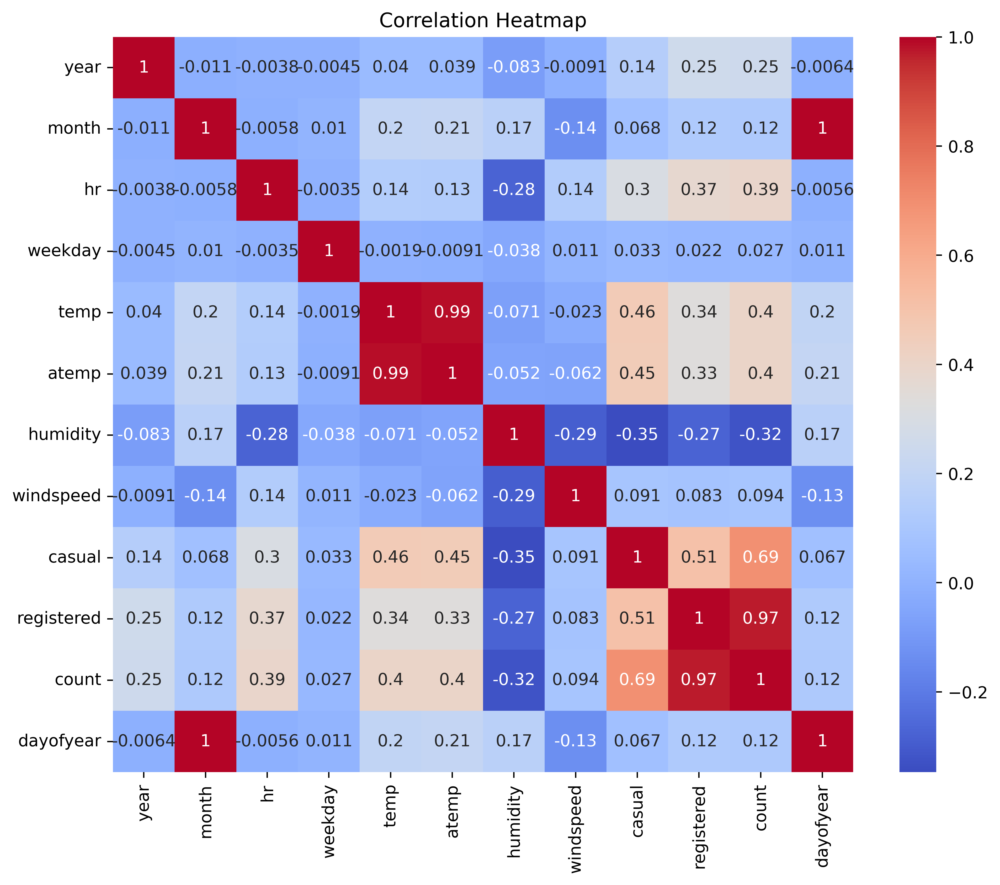

In [41]:
# Heatmap Correaltion between Features
corr=df.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

**Observations:**
- Higher temperatures increases rentals (positive correlation with count)
- Humidity reduces demand, So humidity is negatively coorealted with count
- Few Variables have near to perfect correlations like temp or atemp. Thats why, We can either drop one of these.
- Since Causual + registrered = cnt As Correlation Matrix is showing that  these variable have quite high correlations.

### **3.Feature Engineering**

#### A. Detecting and Handling outliers

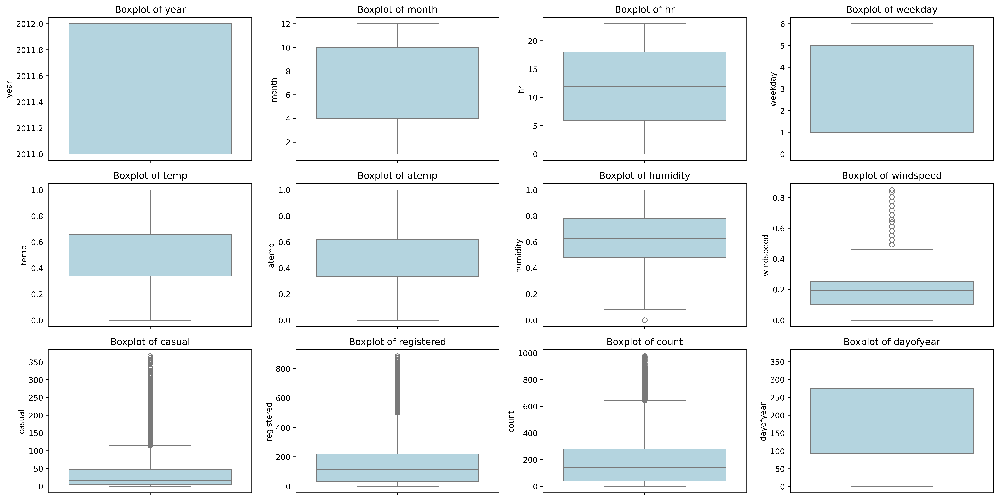

In [45]:
num_df=df.select_dtypes(include='number').columns

# set up subplots for boxplots
n_cols=4
n_rows=int(len(num_df)/ n_cols)+1

plt.figure(figsize=(18, 3*n_rows))
for i, col in enumerate(num_df, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=df, y=col, color='lightblue')
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()
plt.show()

- Outliers in windspeed, casual, registered, and count highlight rare events or extreme usage, requiring careful preprocessing decisions to ensure model performance.

###  Handling Outliers

In [48]:
Q1 = df[num_df].quantile(0.25)
Q3 = df[num_df].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# # Filter rows without outliers
mask = ((df[num_df] >= lower_bound) & (df[num_df] <= upper_bound)).all(axis=1)
df = df[mask]

print("Shape after removing outliers:", df.shape)


Shape after removing outliers: (15221, 18)


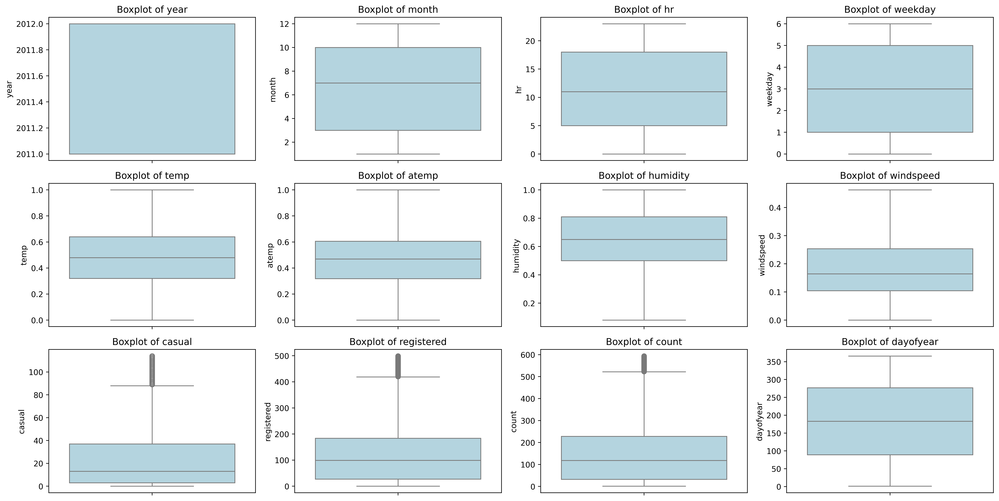

In [49]:
num_df=df.select_dtypes(include='number').columns

# set up subplots for boxplots
n_cols=4
n_rows=int(len(num_df)/ n_cols)+1

plt.figure(figsize=(18, 3*n_rows))
for i, col in enumerate(num_df, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=df, y=col, color='lightblue')
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()
plt.show()

Although outliers are present in the dataset, they represent genuine real-world demand scenarios rather than data anomalies. Removing or transforming these values could negatively impact model performance by eliminating important demand patterns. Therefore, no explicit outlier treatment was applied, as tree-based models such as Decision Tree Regressor, Random Forest Regressor, and Gradient Boosting Regressor are inherently insensitive to outliers.

In [51]:
df.head()

,date,season,year,month,hr,holiday,weekday,workingday,weathersit,temp,atemp,humidity,windspeed,casual,registered,count,datetime,dayofyear
instant,,,,,,,,,,,,,,,,,,
1,2011-01-01,springer,2011,1,0,No,6,No work,Clear,0.24,0.2879,0.81,0.0,3,13,16,2011-01-01 00:00:00,1
2,2011-01-01,springer,2011,1,1,No,6,No work,Clear,0.22,0.2727,0.80,0.0,8,32,40,2011-01-01 01:00:00,1
3,2011-01-01,springer,2011,1,2,No,6,No work,Clear,0.22,0.2727,1.00,0.0,5,27,32,2011-01-01 02:00:00,1
4,2011-01-01,springer,2011,1,3,No,6,No work,Clear,0.24,0.2879,0.75,0.0,3,10,13,2011-01-01 03:00:00,1
5,2011-01-01,springer,2011,1,4,No,6,No work,Clear,0.24,0.2879,0.75,0.0,0,1,1,2011-01-01 04:00:00,1


#### B.Creating New Features

In [53]:
#Time based Features
def time_of_day(hr):
    if 5 <= hr <12:
        return 'morning'
    elif 12 <=hr <17:
        return 'afternoon'
    elif 17 <=hr <21:
        return 'evening'

    else:
        return 'night'

df['time_of_day']=df['hr'].apply(time_of_day)

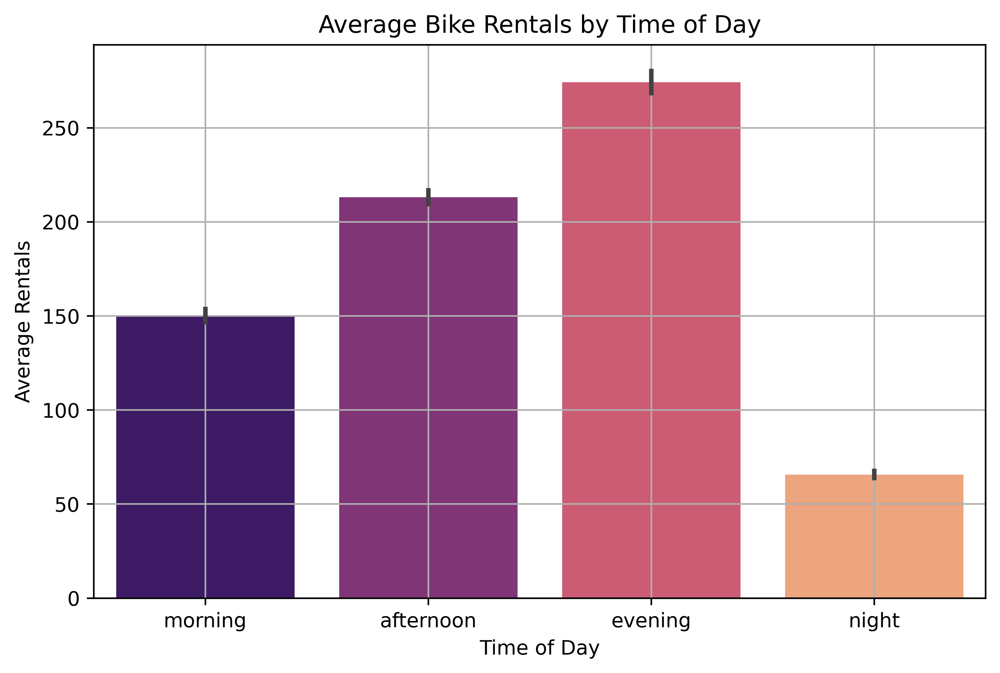

In [54]:
plt.figure(figsize=(8, 5))
sns.barplot(x='time_of_day', y='count', data=df, estimator=np.mean, order=['morning', 'afternoon', 'evening', 'night'], palette='magma')
plt.title('Average Bike Rentals by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Average Rentals')
plt.grid(True)
plt.show()

In [55]:
df['day']=df['date'].dt.day
df['Month']=df['date'].dt.month
df['Year']=df['date'].dt.year
df['Weekday']=df['date'].dt.weekday

#### C. Encoding Features

In [57]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

onehot_col= ['season', 'weathersit', 'time_of_day']
label_col= ['holiday', 'workingday']

#OneHot Encoding 
ohe = OneHotEncoder(sparse_output=False)
ohe_data = ohe.fit_transform(df[onehot_col])

ohe_df = pd.DataFrame(ohe_data, columns=ohe.get_feature_names_out(onehot_col), index=df.index)

# Label Encoding 
le = LabelEncoder()
for col in label_col:
    df[col] = le.fit_transform(df[col])

# Combining All 
df_final = pd.concat([df.drop(columns=onehot_col), ohe_df],axis=1)
print(df_final.head())

              date  year  month  hr  holiday  weekday  workingday  temp  \
instant                                                                   
1       2011-01-01  2011      1   0        0        6           0  0.24   
2       2011-01-01  2011      1   1        0        6           0  0.22   
3       2011-01-01  2011      1   2        0        6           0  0.22   
4       2011-01-01  2011      1   3        0        6           0  0.24   
5       2011-01-01  2011      1   4        0        6           0  0.24   

          atemp  humidity  ...  season_summer  season_winter  \
instant                    ...                                 
1        0.2879      0.81  ...            0.0            0.0   
2        0.2727      0.80  ...            0.0            0.0   
3        0.2727      1.00  ...            0.0            0.0   
4        0.2879      0.75  ...            0.0            0.0   
5        0.2879      0.75  ...            0.0            0.0   

         weathersit_Clear

In [58]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15221 entries, 1 to 17379
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   date                   15221 non-null  datetime64[ns]
 1   year                   15221 non-null  Int64         
 2   month                  15221 non-null  Int64         
 3   hr                     15221 non-null  int64         
 4   holiday                15221 non-null  int32         
 5   weekday                15221 non-null  int64         
 6   workingday             15221 non-null  int32         
 7   temp                   15221 non-null  float64       
 8   atemp                  15221 non-null  float64       
 9   humidity               15221 non-null  float64       
 10  windspeed              15221 non-null  float64       
 11  casual                 15221 non-null  Int64         
 12  registered             15221 non-null  Int64         
 13  count 

### D. Removing Irrelevant Columns

In [60]:
# Drop columns not needed for modeling
df_final=df_final.drop(['date','month', 'year','weekday', 'atemp', 'casual','registered', 'datetime', 'dayofyear'], axis=1)

In [61]:
df_final.columns

Index(['hr', 'holiday', 'workingday', 'temp', 'humidity', 'windspeed', 'count',
       'day', 'Month', 'Year', 'Weekday', 'season_fall', 'season_springer',
       'season_summer', 'season_winter', 'weathersit_Clear',
       'weathersit_Heavy Rain', 'weathersit_Light Snow', 'weathersit_Mist',
       'time_of_day_afternoon', 'time_of_day_evening', 'time_of_day_morning',
       'time_of_day_night'],
      dtype='object')

**Observations**
- The columns date and datetime were removed because they are identifiers and do not directly contribute to predicting demand.
- The atemp column was dropped due to high correlation with temp, which helps reduce multicollinearity.
- The casual and registered columns were excluded because they are components of the target variable cnt, and keeping them would cause data leakage.

## 4. Model Building

#### Feature Splitting

In [65]:
from sklearn.model_selection import train_test_split

#Define Features and target
x=df_final.drop(['count'], axis=1)
y=df_final['count']

#Split data into training and testing set
x_train, x_test, y_train, y_test=train_test_split( x, y, test_size=0.2, random_state=42)

#### F. Scaling Numerical Features

In [67]:
print('X_trian:', x_train.shape)
print('x_test:', x_test.shape)

X_trian: (12176, 22)
x_test: (3045, 22)


### Decision Tree Regressor

In [69]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn import tree
from sklearn import metrics

Dt=DecisionTreeRegressor(max_depth=10, min_samples_split=15,
                         min_samples_leaf=10, random_state=42)
Dt.fit(x_train, y_train)

y_pred_train=Dt.predict(x_train)
y_pred_test=Dt.predict(x_test)

rmse_train= np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
rmse_test=np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
r2_train=r2_score(y_train, y_pred_train)*100
r2_test=r2_score(y_test, y_pred_test)*100

print('Decision Tree Metrics:')
print('RMSE Train:', np.round(rmse_train, 3))
print('RMSE Test:', np.round(rmse_test, 3))
print('R2_Score Train:', np.round(r2_train, 3))
print('R2_Score Test:',np.round(r2_test, 3))

Decision Tree Metrics:
RMSE Train: 43.325
RMSE Test: 46.773
R2_Score Train: 89.171
R2_Score Test: 86.769


**Conclusion:**
- The model predicts bike rentals well.
- R² score is 0.91 on training data and 0.89 on test data, showing good accuracy.
- Train and test scores are close, so overfitting is low.
- Prediction errors are small and consistent.

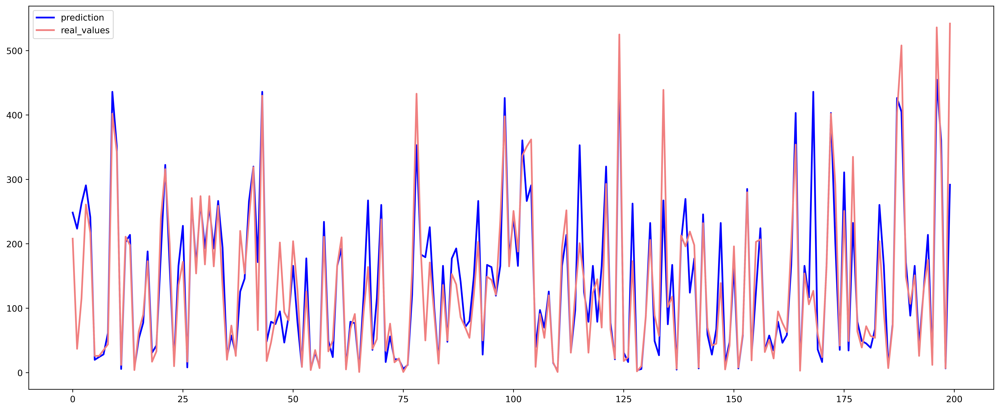

In [71]:
plt.figure(figsize=(20,8))
plt.plot(Dt.predict(x_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
#plt.savefig('plots/dt_real_pred.png')
plt.show()

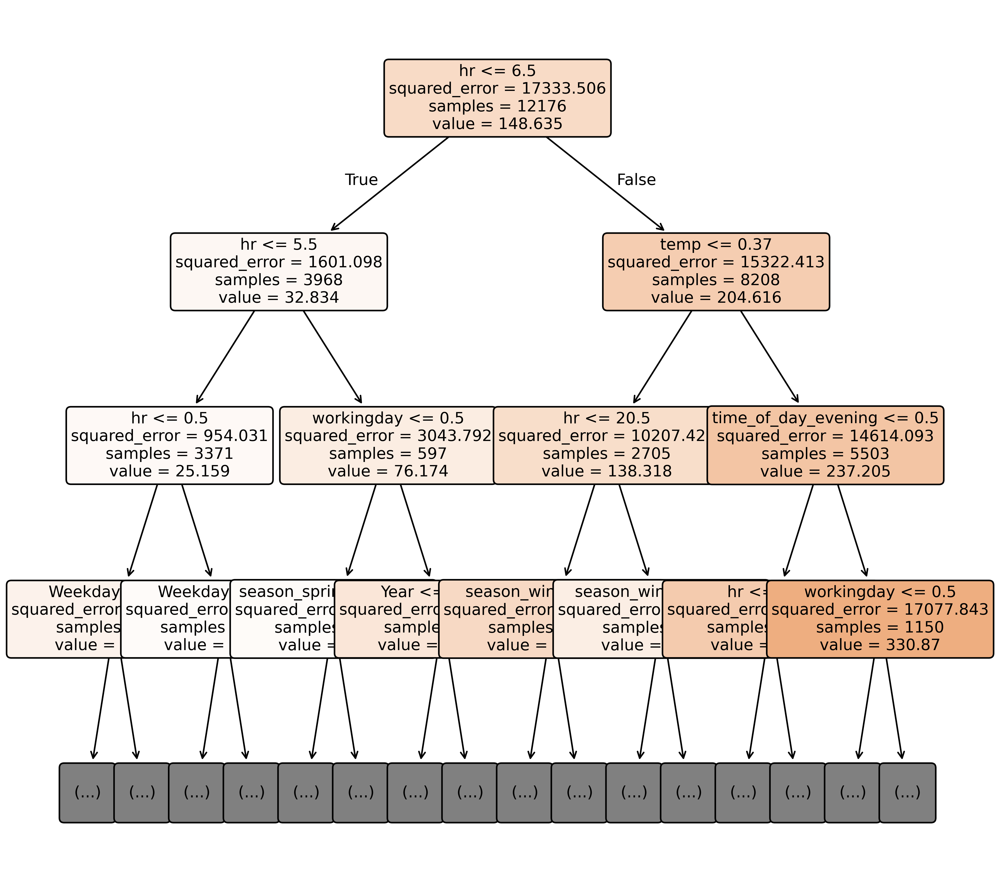

In [72]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

tree.plot_tree(Dt, feature_names=x.columns, max_depth=3, filled=True, rounded=True, fontsize=10)
plt.show()

### Random Forest Regressor

In [74]:
from sklearn.ensemble import RandomForestRegressor

rf_model =RandomForestRegressor(n_estimators=200, max_depth=15, 
                                min_samples_split=10, min_samples_leaf=5,
                               random_state=42, n_jobs=-1)

rf_model.fit(x_train, y_train)

#Predictions
y_train_predrf=rf_model.predict(x_train)
y_test_predrf=rf_model.predict(x_test)

#Evaluation
rf_train_rmse=np.sqrt(mean_squared_error(y_train, y_train_predrf))
rf_test_rmse=np.sqrt(mean_squared_error(y_test, y_test_predrf))
rf_train_r2=r2_score(y_train, y_train_predrf)*100
rf_test_r2=r2_score(y_test, y_test_predrf)*100

print('Random Forest Metrics')
print('RMSE Train:', np.round(rf_train_rmse,3))
print('RMSE Test:', np.round(rf_test_rmse, 3))
print('R2 Score Train:', np.round(rf_train_r2, 3))
print('R2 score Test:', np.round(rf_test_r2, 3))

Random Forest Metrics
RMSE Train: 27.737
RMSE Test: 36.407
R2 Score Train: 95.562
R2 score Test: 91.983


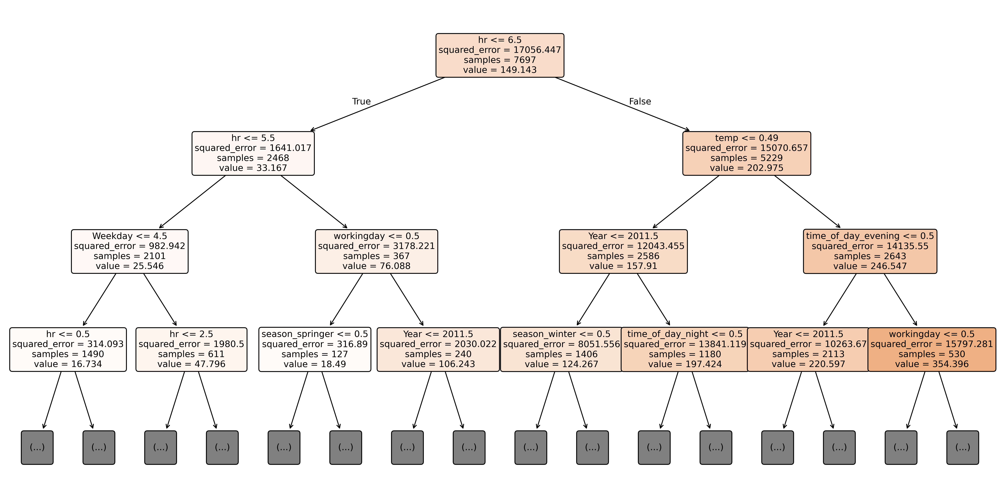

In [75]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

single_tree=rf_model.estimators_[0]

plt.figure(figsize=(20, 10))
tree.plot_tree(single_tree, feature_names=x.columns, max_depth=3, filled=True, rounded=True, fontsize=10)
plt.show()

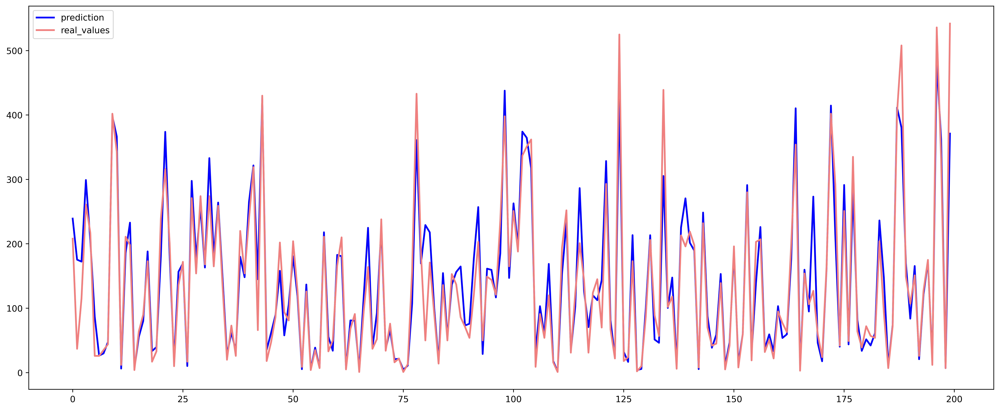

In [76]:
plt.figure(figsize=(20,8))
plt.plot(rf_model.predict(x_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
#plt.savefig('plots/dt_real_pred.png')
plt.show()

### GradientBoosting Regressor Model

In [78]:
from sklearn.ensemble import GradientBoostingRegressor

gb_model=GradientBoostingRegressor(
    n_estimators=100, learning_rate=0.1,
    max_depth=5, random_state=42
)

gb_model.fit(x_train, y_train)

ypred_train_gb=gb_model.predict(x_train)
ypred_test_gb=gb_model.predict(x_test)

rmse_train_gb=np.sqrt(mean_squared_error(y_train, ypred_train_gb))
rmse_test_gb=np.sqrt(mean_squared_error(y_test, ypred_test_gb))
r2_train_gb=r2_score(y_train, ypred_train_gb)*100
r2_test_gb=r2_score(y_test, ypred_test_gb)*100

print('GradientBoosting Regressor Model:')
print('Train RMSE:', np.round(rmse_train_gb, 3))
print('Test RMSE:', np.round(rmse_test, 3))
print('R2 Score Train:', np.round(r2_train_gb, 3))
print('R2 Score Test:', np.round(r2_test_gb, 3))

GradientBoosting Regressor Model:
Train RMSE: 35.245
Test RMSE: 46.773
R2 Score Train: 92.833
R2 Score Test: 91.558


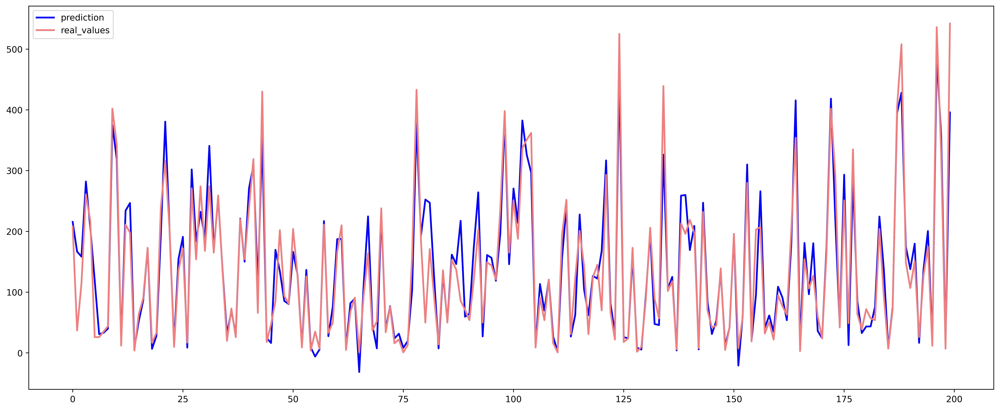

In [79]:
plt.figure(figsize=(20,8))
plt.plot(gb_model.predict(x_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
#plt.savefig('plots/gb_real_pred.png')
plt.show()

### XGBoosting Regressor

In [81]:
import xgboost as xgb

xgb_model=xgb.XGBRegressor(n_estimators=300, learning_rate=0.05, 
                            max_depth=8, subsample=0.8, colsample_bytree=0.7,
                           min_child_weight=7,
                            objective='reg:squarederror', n_jobs=-1, random_state=42)
xgb_model.fit(x_train, y_train)

ypred_train_xgb=xgb_model.predict(x_train)
ypred_test_xgb=xgb_model.predict(x_test)

rmse_train_xgb=np.sqrt(mean_squared_error(y_train, ypred_train_xgb))
rmse_test_xgb=np.sqrt(mean_squared_error(y_test, ypred_test_xgb))
r2_train_xgb=r2_score(y_train, ypred_train_xgb)*100
r2_test_xgb=r2_score(y_test, ypred_test_xgb)*100

print('XGBoosting Metrics:')
print('RMSE Train:', np.round(rmse_train_xgb,3))
print('RMSE Test:', np.round(rmse_test_xgb, 3))
print('R2 Score Train:', np.round(r2_train_xgb, 3))
print('R2 score Test:', np.round(r2_test_xgb, 3))

XGBoosting Metrics:
RMSE Train: 17.45
RMSE Test: 28.8
R2 Score Train: 98.243
R2 score Test: 94.984


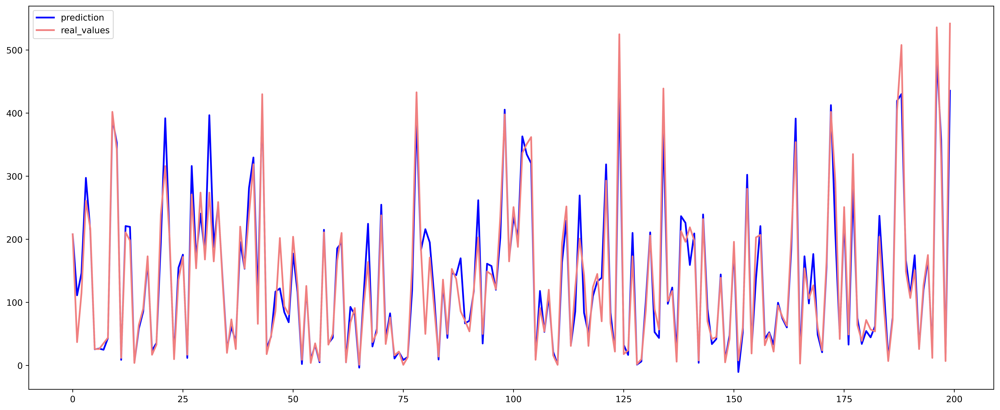

In [82]:
plt.figure(figsize=(20,8))
plt.plot(xgb_model.predict(x_test[:200]), label="prediction", linewidth=2.0,color='blue')
plt.plot(y_test[:200].values, label="real_values", linewidth=2.0,color='lightcoral')
plt.legend(loc="best")
#plt.savefig('plots/gb_real_pred.png')
plt.show()

### Hyperparameter Tuning Using RandomSearchCV

In [84]:
# Decision Tree
from sklearn.model_selection import RandomizedSearchCV

dt = DecisionTreeRegressor(random_state=42)

param_dist_dt = {
    'max_depth': [None, 5, 8, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 20, 30],
    'min_samples_leaf': [1, 5, 10, 20]
}

random_dt = RandomizedSearchCV(
    estimator=dt,
    param_distributions=param_dist_dt,
    n_iter=30,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1
)

random_dt.fit(x_train, y_train)
best_dt = random_dt.best_estimator_

y_train_pred_dt = best_dt.predict(x_train)
y_test_pred_dt = best_dt.predict(x_test)

#Evaluation
train_mae_dt = mean_absolute_error(y_train, y_train_pred_dt)
train_rmse_dt = np.sqrt(mean_squared_error(y_train, y_train_pred_dt))
train_r2_dt = r2_score(y_train, y_train_pred_dt)

test_mae_dt = mean_absolute_error(y_test, y_test_pred_dt)
test_rmse_dt = np.sqrt(mean_squared_error(y_test, y_test_pred_dt))
test_r2_dt = r2_score(y_test, y_test_pred_dt)

print("Best Parameters:",random_dt.best_params_)

print("Decision Tree Regressor Performance")
print("Training MAE :", train_mae_dt)
print("Testing MAE  :", test_mae_dt)

print("Training RMSE:", train_rmse_dt)
print("Testing RMSE :", test_rmse_dt)

print("Training R2  :", train_r2_dt)
print("Testing R2   :", test_r2_dt)



Best Parameters: {'min_samples_split': 20, 'min_samples_leaf': 5, 'max_depth': 15}
Decision Tree Regressor Performance
Training MAE : 20.456949899025087
Testing MAE  : 26.23735085861477
Training RMSE: 33.23062898036985
Testing RMSE : 41.80766552977688
Training R2  : 0.9362924775232447
Testing R2   : 0.8942891154089073


In [85]:
# Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(random_state=42, n_jobs=-1)

param_dist_rf = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [None, 10, 15, 20, 30],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 5, 10],
    'max_features': ['sqrt', 'log2']
}

random_rf = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist_rf,
    n_iter=30,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1
)

random_rf.fit(x_train, y_train)
best_rf = random_rf.best_estimator_
y_train_pred_rf = best_rf.predict(x_train)
y_test_pred_rf = best_rf.predict(x_test)

# Evaluation
train_mae_rf = mean_absolute_error(y_train, y_train_pred_rf)
train_rmse_rf = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
train_r2_rf = r2_score(y_train, y_train_pred_rf)


test_mae_rf = mean_absolute_error(y_test, y_test_pred_rf)
test_rmse_rf = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))
test_r2_rf = r2_score(y_test, y_test_pred_rf)

print("Best Parameters:",random_rf.best_params_)

print("Random Forest Regressor Performance")
print("Training MAE :", train_mae_rf)
print("Testing MAE  :", test_mae_rf)
print("Training RMSE:", train_rmse_rf)
print("Testing RMSE :", test_rmse_rf)
print("Training R2  :", train_r2_rf)
print("Testing R2   :", test_r2_rf)

Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 30}
Random Forest Regressor Performance
Training MAE : 10.168611203192613
Testing MAE  : 26.4694649644827
Training RMSE: 15.272377613551775
Testing RMSE : 39.534901809231094
Training R2  : 0.9865436616033834
Testing R2   : 0.9054700996380857


In [86]:
# GradientBoosting Regressor
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(random_state=42)

param_dist_gbr = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.03, 0.05, 0.1],
    'max_depth': [2, 3, 4, 5],
    'min_samples_split': [5, 10, 20],
    'min_samples_leaf': [5, 10, 20],
}

random_gbr = RandomizedSearchCV(
    estimator=gbr,
    param_distributions=param_dist_gbr,
    n_iter=30,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1
)

random_gbr.fit(x_train, y_train)
best_gbr = random_gbr.best_estimator_

y_train_pred_gbr = best_gbr.predict(x_train)
y_test_pred_gbr = best_gbr.predict(x_test)

# Evaluation
train_mae_gbr = mean_absolute_error(y_train, y_train_pred_gbr)
train_rmse_gbr = np.sqrt(mean_squared_error(y_train, y_train_pred_gbr))
train_r2_gbr = r2_score(y_train, y_train_pred_gbr)


test_mae_gbr = mean_absolute_error(y_test, y_test_pred_gbr)
test_rmse_gbr = np.sqrt(mean_squared_error(y_test, y_test_pred_gbr))
test_r2_gbr = r2_score(y_test, y_test_pred_gbr)

print("Best Parameters:",random_gbr.best_params_)

print("Gradient Boosting Regressor Performance")
print("Training MAE :", train_mae_gbr)
print("Testing MAE  :", test_mae_gbr)

print("Training RMSE:", train_rmse_gbr)
print("Testing RMSE :", test_rmse_gbr)

print("Training R2  :", train_r2_gbr)
print("Testing R2   :", test_r2_gbr)


Best Parameters: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 20, 'max_depth': 5, 'learning_rate': 0.1}
Gradient Boosting Regressor Performance
Training MAE : 19.757315025433613
Testing MAE  : 22.320949201407817
Training RMSE: 30.1710534038456
Testing RMSE : 33.805453034828524
Training R2  : 0.9474836492667686
Testing R2   : 0.9308835550347321


In [87]:
Accuracy={'Model':['DecisionTree_Reg', 'Random_Forest', 'GradientBoost_Reg', 'XGBoost' ], 'Accuracy':[r2_train,rf_train_r2,r2_train_gb,r2_train_xgb]}
acc_df=pd.DataFrame(Accuracy)
acc_df

,Model,Accuracy
0,DecisionTree_Reg,89.170712
1,Random_Forest,95.561598
2,GradientBoost_Reg,92.833443
3,XGBoost,98.243344


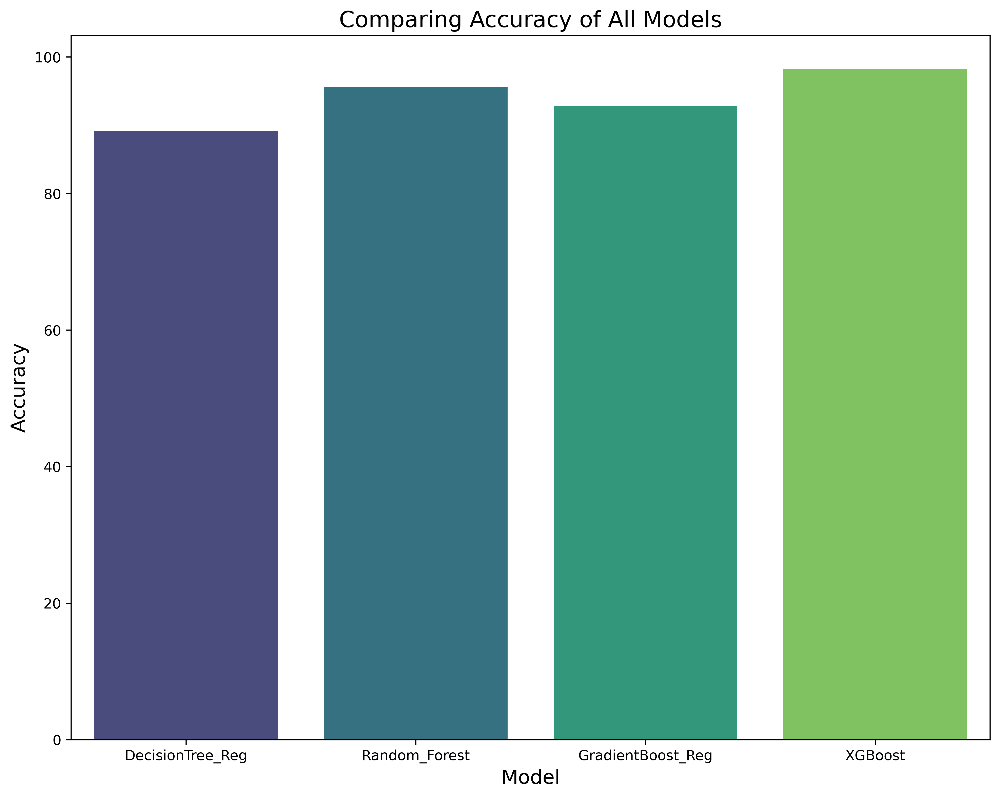

In [88]:
plt.figure(figsize=(10,8))
sns.barplot(x='Model',y='Accuracy',data=acc_df, palette='viridis')
plt.title('Comparing Accuracy of All Models', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)

plt.tight_layout()
plt.savefig('plots/compared_models.png')
plt.show()